# Data analysis

### Download data

In [1]:
import sys

sys.path.append(r'C:\Users\aleks\Projects\PLScorePrediction')
sys.path.append(r'C:\Users\aleks\Projects\PLScorePrediction\src')
sys.path.append(r'C:\Users\aleks\Projects\PLScorePrediction\src\data')

In [2]:
from src.data.stats_downloader import (StatsDownloaderConfig, 
                                       BaseDownloaderConfig, 
                                       ClubsStatsDownloader, 
                                       MatchResultsDownloader)

In [3]:
# Prepare config
results_download_config = BaseDownloaderConfig(seasons=['all']) 
club_download_config = StatsDownloaderConfig()

In [4]:
results_downloader = MatchResultsDownloader(config=results_download_config)
results = results_downloader.download()

club_stats_downloader = ClubsStatsDownloader(config=club_download_config)
club_stats = club_stats_downloader.download()

No season all available! Skipping ...
No all stats available! Skipping ...


## Matches results analysis

In [50]:
import pandas as pd
import matplotlib.pyplot as plt

In [6]:
results.keys()

dict_keys(['2021/2022', '2020/2021', '2019/20', '2018/19', '2017/18', '2016/17', '2015/16', '2014/15', '2013/14', '2012/13', '2011/12', '2010/11', '2009/10', '2008/09', '2007/08', '2006/07', '2005/06', '2004/05', '2003/04', '2002/03', '2001/02', '2000/01', '1999/00', '1998/99', '1997/98', '1996/97', '1995/96'])

In [7]:
def process_score_str_to_int(scores):
    home_score = []
    away_score = []
    for score in scores:
        home_score.append(int(score[0]))
        away_score.append(int(score[2]))
    return home_score, away_score

In [8]:
results_df = pd.DataFrame()

for k in results.keys():
    if results_df.empty:
        results_df = pd.DataFrame.from_dict(results[k])
        results_df['season'] = [k]*len(results_df)
        home_score, away_score = process_score_str_to_int(results_df['scores'])
        results_df['ht_score'] = home_score
        results_df['at_score'] = away_score
    else:
        tmp = pd.DataFrame.from_dict(results[k])
        tmp['season'] = [k]*len(tmp)
        home_score, away_score = process_score_str_to_int(tmp['scores'])
        tmp['ht_score'] = home_score
        tmp['at_score'] = away_score
        results_df = pd.concat([results_df, tmp])
        

In [9]:
results_df.drop('scores', axis=1)

,home_team,away_team,season,ht_score,at_score
0,brentford,arsenal,2021/2022,2,0
1,manchester utd,leeds united,2021/2022,5,1
2,leicester city,wolves,2021/2022,1,0
3,burnley,brighton,2021/2022,1,2
4,chelsea,crystal palace,2021/2022,3,0
...,...,...,...,...,...
375,chelsea,blackburn,1995/96,2,3
376,manchester city,liverpool,1995/96,2,2
377,arsenal,bolton,1995/96,2,1
378,nott'ham forest,qpr,1995/96,3,0


In [31]:
# Add result - ht_win/at_win/draw /0/1/2
result_class = []
for record in results_df[['ht_score', 'at_score']].values:
    if record[0] > record[1]:
        result_class.append(0)
    elif record[0] < record[1]:
        result_class.append(1)
    else:
        result_class.append(2)
        
results_df['match_result'] = result_class

In [34]:
results_df = results_df.reset_index()

In [35]:
results_df.tail(5)

,index,home_team,scores,away_team,season,ht_score,at_score,match_result
10255,375,chelsea,2–3,blackburn,1995/96,2,3,1
10256,376,manchester city,2–2,liverpool,1995/96,2,2,2
10257,377,arsenal,2–1,bolton,1995/96,2,1,0
10258,378,nott'ham forest,3–0,qpr,1995/96,3,0,0
10259,379,west ham,1–1,sheffield weds,1995/96,1,1,2


In [90]:
from itertools import combinations
all_clubs = set(results_df['home_team'])
all_combinations = list(combinations(all_clubs,2))

In [91]:
matches_per_pair = {}

for pair in all_combinations:
    pair_results = results_df.loc[(results_df['home_team'] == pair[0]) & (results_df['away_team'] == pair[1])]
    if not pair_results.empty:
        matches_per_pair[f'{pair[0]} {pair[1]}'] = pair_results.reset_index()


C:\Users\aleks\AppData\Local\Temp\ipykernel_4200\3456311019.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


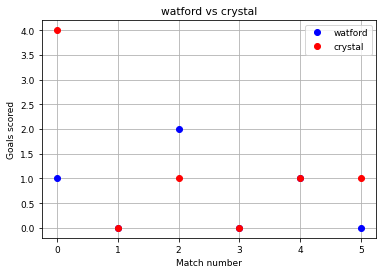

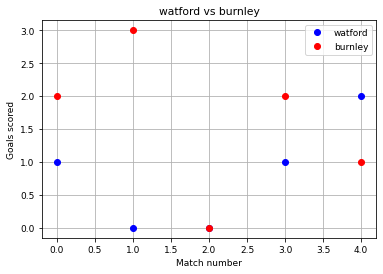

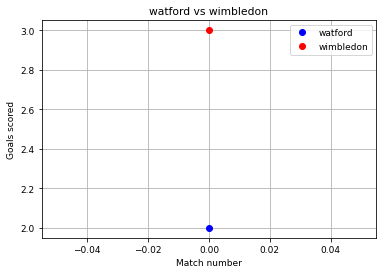

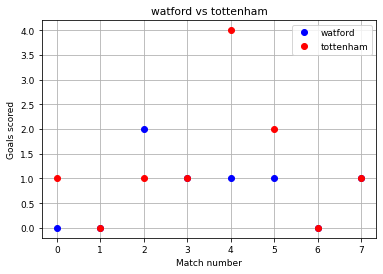

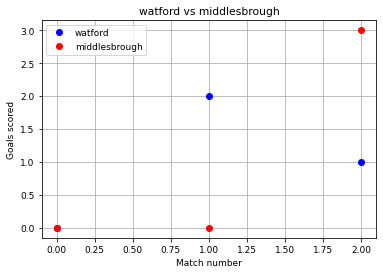

...

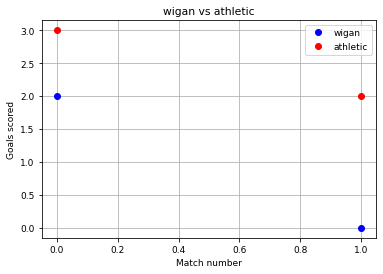

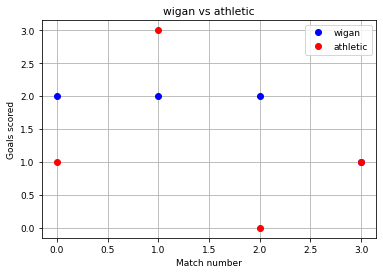

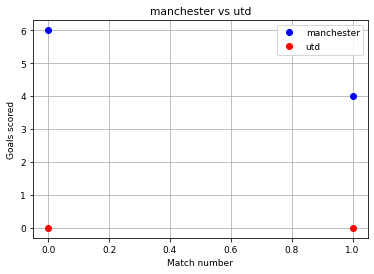

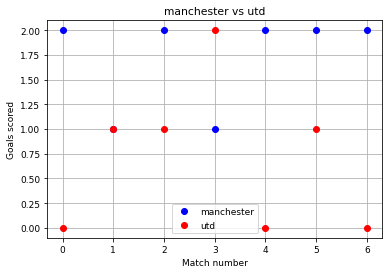

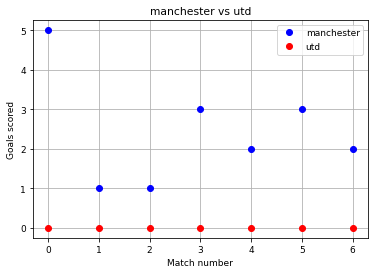

In [93]:
for k in matches_per_pair.keys():
    clubs = k.split()
    plt.figure()
    plt.title(f'{clubs[0]} vs {clubs[1]}')
    plt.plot(matches_per_pair[k].ht_score, 'bo')
    plt.plot(matches_per_pair[k].at_score, 'ro')
    plt.grid()
    plt.xlabel('Match number')
    plt.ylabel('Goals scored')
    plt.legend([clubs[0], clubs[1]])

## Clubs stats analysis

In [10]:
import pandas as pd
import matplotlib.pyplot as plt

In [11]:
club_stats

{'arsenal': [{'squad': 'Arsenal',
   'country': 'eng ENG',
   'comp_level': '1. Premier League',
   'lg_finish': '5th',
   'games': '38',
   'wins': '22',
   'draws': '3',
   'losses': '13',
   'goals_for': '61',
   'goals_against': '48',
   'goal_diff': '+13',
   'points': '69',
   'attendance_per_g': '59,665',
   'top_team_scorers': 'Bukayo Saka - 11',
   'top_keeper': 'Aaron Ramsdale',
   'notes': ''},
  {'squad': 'Arsenal',
   'country': 'eng ENG',
   'comp_level': '1. Premier League',
   'lg_finish': '8th',
   'games': '38',
   'wins': '18',
   'draws': '7',
   'losses': '13',
   'goals_for': '55',
   'goals_against': '39',
   'goal_diff': '+16',
   'points': '61',
   'attendance_per_g': '632',
   'top_team_scorers': 'Alexandre Lacazette - 13',
   'top_keeper': 'Bernd Leno',
   'notes': ''},
  {'squad': 'Arsenal',
   'country': 'eng ENG',
   'comp_level': '1. Premier League',
   'lg_finish': '8th',
   'games': '38',
   'wins': '14',
   'draws': '14',
   'losses': '10',
   'goals_f

In [12]:
pd.DataFrame.from_dict(club_stats['arsenal'])

,squad,country,comp_level,lg_finish,games,wins,draws,losses,goals_for,goals_against,goal_diff,points,attendance_per_g,top_team_scorers,top_keeper,notes
0,Arsenal,eng ENG,1. Premier League,5th,38,22,3,13,61,48,+13,69,"59,665",Bukayo Saka - 11,Aaron Ramsdale,
1,Arsenal,eng ENG,1. Premier League,8th,38,18,7,13,55,39,+16,61,632,Alexandre Lacazette - 13,Bernd Leno,
2,Arsenal,eng ENG,1. Premier League,8th,38,14,14,10,56,48,+8,56,"47,589",Pierre-Emerick Aubameyang - 22,Bernd Leno,→ UEFA Europa League via cup win
3,Arsenal,eng ENG,1. Premier League,5th,38,21,7,10,73,51,+22,70,"59,899",Pierre-Emerick Aubameyang - 22,Bernd Leno,→ UEFA Europa League via league finish
4,Arsenal,eng ENG,1. Premier League,6th,38,19,6,13,74,51,+23,63,"59,323",Alexandre Lacazette - 14,Petr Čech,→ UEFA Europa League via league finish
5,Arsenal,eng ENG,1. Premier League,5th,38,23,6,9,77,44,+33,75,"59,957",Alexis Sánchez - 24,Petr Čech,→ UEFA Europa League via cup win
6,Arsenal,eng ENG,1. Premier League,2nd,38,20,11,7,65,36,+29,71,"59,944",Olivier Giroud - 16,Petr Čech,→ UEFA Champions League via league finish
7,Arsenal,eng ENG,1. Premier League,3rd,38,22,9,7,71,36,+35,75,"59,992",Alexis Sánchez - 16,David Ospina,→ UEFA Champions League via league finish
8,Arsenal,eng ENG,1. Premier League,4th,38,24,7,7,68,41,+27,79,"60,013",Olivier Giroud - 16,Wojciech Szczęsny,→ UEFA Champions League via league finish
9,Arsenal,eng ENG,1. Premier League,4th,38,21,10,7,72,37,+35,73,"60,079",Theo Walcott - 14,Wojciech Szczęsny,→ UEFA Champions League via league finish


In [187]:
seasons = ['2021/2022', '2020/2021', '2019/2020', '2018/2019', '2017/2018',
           '2016/2017', '2015/2016', '2014/2015', '2013/2014', '2012/2013',
           '2011/2012', '2010/2011', '2009/2010', '2008/2009', '2007/2008',
           '2006/2007', '2005/2006', '2004/2005', '2003/2004', '2002/2003',
           '2001/2002', '2000/2001', '1999/2000', '1998/1999', '1997/1998',
           '1996/1997', '1995/1996', '1994/1995', '1993/1994', '1992/1993', 
           '1991/1992', '1990/1991', '1989/1990', '1988/1989', '1987/1988']

clubs_stats_df = pd.DataFrame()

for k in club_stats.keys():
    if clubs_stats_df.empty:
        clubs_stats_df = pd.DataFrame.from_dict(club_stats[k])
        clubs_stats_df['season'] = seasons[0:len(clubs_stats_df)]

    else:
        tmp = pd.DataFrame.from_dict(club_stats[k])
        tmp['season'] = seasons[0:len(tmp)]
        clubs_stats_df = pd.concat([clubs_stats_df, tmp])

        
clubs_stats_df = clubs_stats_df.reset_index(drop=True)
clubs_stats_df['squad'] = clubs_stats_df['squad'].str.lower()
clubs_stats_df['games'] = pd.to_numeric(clubs_stats_df['games'])
clubs_stats_df['wins'] = pd.to_numeric(clubs_stats_df['wins'])
clubs_stats_df['draws'] = pd.to_numeric(clubs_stats_df['draws'])
clubs_stats_df['losses'] = pd.to_numeric(clubs_stats_df['losses'])
clubs_stats_df['goals_for'] = pd.to_numeric(clubs_stats_df['goals_for'])
clubs_stats_df['goals_aganist'] = pd.to_numeric(clubs_stats_df['goals_against'])
clubs_stats_df['goal_diff'] = pd.to_numeric(clubs_stats_df['goal_diff'])
clubs_stats_df['points'] = pd.to_numeric(clubs_stats_df['points'])

In [188]:
clubs_stats_df.tail(5)

,squad,country,comp_level,lg_finish,games,wins,draws,losses,goals_for,goals_against,goal_diff,points,attendance_per_g,top_team_scorers,top_keeper,notes,season,goals_aganist
535,tottenham,eng ENG,1. Premier League,10th,38.0,13.0,7.0,18.0,44.0,51,-7.0,46.0,"31,067",Teddy Sheringham - 7,Ian Walker,,1996/1997,51.0
536,tottenham,eng ENG,1. Premier League,8th,38.0,16.0,13.0,9.0,50.0,38,12.0,61.0,"30,548",Teddy Sheringham - 16,Ian Walker,,1995/1996,38.0
537,tottenham,eng ENG,1. Premier League,7th,42.0,16.0,14.0,12.0,66.0,58,8.0,62.0,"26,032",Jürgen Klinsmann - 20,Ian Walker,,1994/1995,58.0
538,tottenham,eng ENG,1. Premier League,15th,42.0,11.0,12.0,19.0,54.0,59,-5.0,45.0,"27,255",Teddy Sheringham - 14,Erik Thorstvedt,,1993/1994,59.0
539,tottenham,eng ENG,1. Premier League,8th,42.0,16.0,11.0,15.0,60.0,66,-6.0,59.0,"27,879",Teddy Sheringham - 21,Erik Thorstvedt,,1992/1993,66.0


In [189]:
club_stats_gr_squad = clubs_stats_df.groupby('squad') 
club_stats_mean = club_stats_gr_squad.mean()

In [190]:
club_stats_mean.tail(5)

,games,wins,draws,losses,goals_for,goal_diff,points,goals_aganist
squad,,,,,,,,
southampton,40.266667,13.600000,11.133333,15.533333,52.066667,-3.166667,51.600000,55.233333
tottenham,38.400000,16.733333,9.366667,12.300000,58.166667,10.233333,59.566667,47.933333
watford,43.090909,14.863636,10.772727,17.454545,56.636364,-5.045455,55.363636,61.681818
west ham,39.103448,13.758621,10.137931,15.206897,49.965517,-4.448276,51.413793,54.413793
wolves,42.952381,17.142857,11.714286,14.095238,57.238095,4.047619,63.142857,53.190476


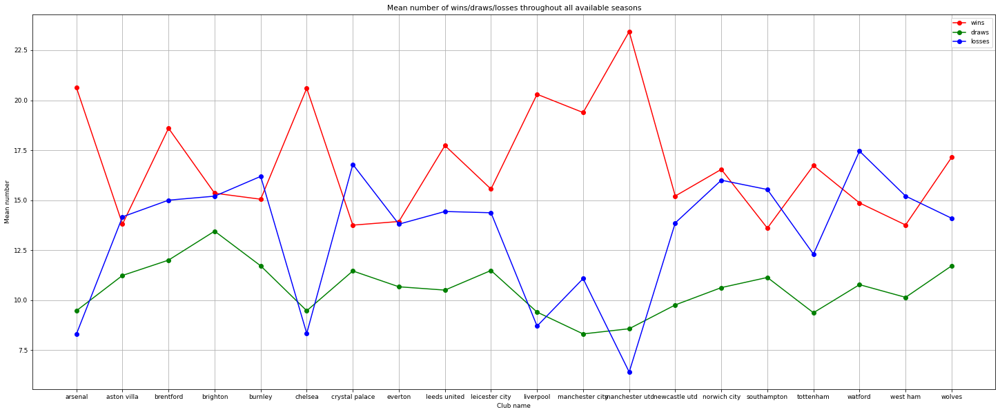

In [111]:
plt.figure(figsize=(25,10))
plt.rcParams.update({'font.size': 9})
plt.plot(club_stats_gr_squad.groups.keys(), club_stats_mean.wins, 'ro-',
         club_stats_gr_squad.groups.keys(), club_stats_mean.draws, 'go-',
         club_stats_gr_squad.groups.keys(), club_stats_mean.losses, 'bo-')
plt.grid()
plt.xlabel('Club name')
plt.ylabel('Mean number')
plt.title('Mean number of wins/draws/losses throughout all available seasons')
plt.legend(['wins', 'draws', 'losses'])

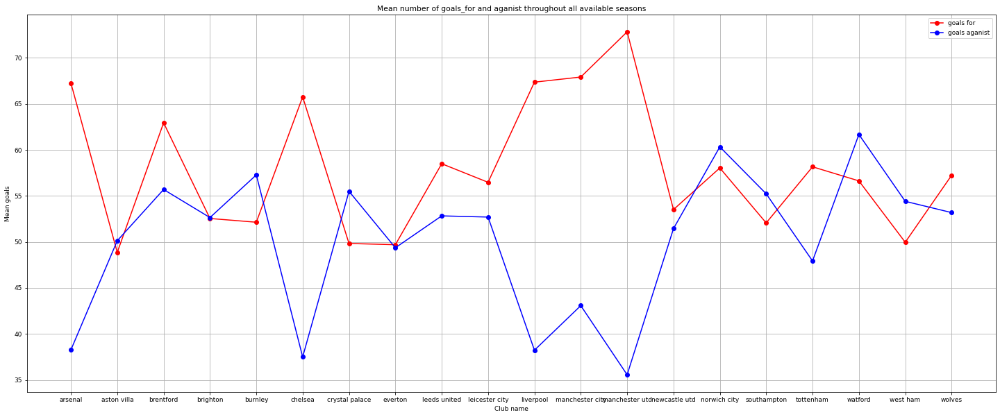

In [112]:
plt.figure(figsize=(25,10))
plt.rcParams.update({'font.size': 9})
plt.plot(club_stats_gr_squad.groups.keys(), club_stats_mean.goals_for, 'ro-',
         club_stats_gr_squad.groups.keys(), club_stats_mean.goals_aganist, 'bo-')
plt.grid()
plt.xlabel('Club name')
plt.ylabel('Mean goals')
plt.title('Mean number of goals_for and aganist throughout all available seasons')
plt.legend(['goals for', 'goals aganist'])

## Put data together

In [209]:
valid_clubs = list(club_stats_gr_squad.groups.keys())
valid_clubs = [club.lower() for club in valid_clubs if club]

In [210]:
valid_results = results_df[(results_df['home_team'].isin(valid_clubs)) & (results_df['away_team'].isin(valid_clubs))].drop('scores', axis=1)
valid_results = valid_results.drop('ht_score', axis=1).drop('at_score', axis=1)

In [211]:
# Add other data
valid_results['ht_avg_wins'] = 0
valid_results['ht_avg_draws'] = 0
valid_results['ht_avg_losses'] = 0
valid_results['ht_avg_goals_for'] = 0
valid_results['ht_avg_goals_aganist'] = 0
valid_results['ht_avg_season_points'] = 0

valid_results['at_avg_wins'] = 0
valid_results['at_avg_draws'] = 0
valid_results['at_avg_losses'] = 0
valid_results['at_avg_goals_for'] = 0
valid_results['at_avg_goals_aganist'] = 0
valid_results['at_avg_season_points'] = 0

In [214]:
valid_results.tail(4)

,index,home_team,away_team,season,match_result,ht_avg_wins,ht_avg_draws,ht_avg_losses,ht_avg_goals_for,ht_avg_goals_aganist,ht_avg_season_points,at_avg_wins,at_avg_draws,at_avg_losses,at_avg_goals_for,at_avg_goals_aganist,at_avg_season_points
10248,368,leeds united,tottenham,1995/96,1,0,0,0,0,0,0,0,0,0,0,0,0
10251,371,everton,aston villa,1995/96,0,0,0,0,0,0,0,0,0,0,0,0,0
10253,373,newcastle utd,tottenham,1995/96,2,0,0,0,0,0,0,0,0,0,0,0,0
10256,376,manchester city,liverpool,1995/96,2,0,0,0,0,0,0,0,0,0,0,0,0


In [192]:
club_stats_mean['club'] = club_stats_gr_squad.groups.keys() #[c for c in club_stats_gr_squad.groups.keys() if c]

In [193]:
club_stats_mean = club_stats_mean.dropna()

In [194]:
club_stats_mean.tail(4)

,games,wins,draws,losses,goals_for,goal_diff,points,goals_aganist,club
squad,,,,,,,,,
tottenham,38.400000,16.733333,9.366667,12.300000,58.166667,10.233333,59.566667,47.933333,tottenham
watford,43.090909,14.863636,10.772727,17.454545,56.636364,-5.045455,55.363636,61.681818,watford
west ham,39.103448,13.758621,10.137931,15.206897,49.965517,-4.448276,51.413793,54.413793,west ham
wolves,42.952381,17.142857,11.714286,14.095238,57.238095,4.047619,63.142857,53.190476,wolves


In [241]:
for i in range(len(valid_results)):
    ht_stats = club_stats_mean[club_stats_mean['club'] == valid_results.iloc[i]['home_team']]
    at_stats = club_stats_mean[club_stats_mean['club'] == valid_results.iloc[i]['away_team']]
    
    print(ht_stats['wins'].item())
    
    #valid_results.at[i, 'ht_avg_wins'] = ht_stats['wins'].item()
    #valid_results.at[i, 'ht_avg_draws'] = ht_stats['draws'].item()
    #valid_results.at[i, 'ht_avg_losses'] = ht_stats['losses'].item()
    #valid_results.at[i, 'ht_avg_goals_for'] = ht_stats['goals_for'].item()
    #valid_results.at[i, 'ht_avg_goals_aganist'] = ht_stats['goals_aganist'].item()
    #valid_results.at[i, 'ht_avg_season_points'] = ht_stats['points'].item()
    #valid_results.at[i, 'at_avg_wins'] = at_stats['wins'].item()
    #valid_results.at[i, 'at_avg_draws'] = at_stats['draws'].item()
    #valid_results.at[i, 'at_avg_losses'] = at_stats['losses'].item()
    #valid_results.at[i, 'at_avg_goals_for'] = at_stats['goals_for'].item()
    #valid_results.at[i, 'at_avg_goals_aganist'] = at_stats['goals_aganist'].item()
    #valid_results.at[i, 'at_avg_season_points'] = at_stats['points'].item()

18.6
23.433333333333334
15.555555555555555
15.047619047619047
20.6
14.863636363636363
13.933333333333334
16.541666666666668
15.206896551724139
16.733333333333334
20.3
13.8
19.384615384615383
17.733333333333334
13.75
15.35
17.142857142857142
13.6
20.633333333333333
13.758620689655173
19.384615384615383
16.541666666666668
13.758620689655173
13.8
15.206896551724139
15.35
20.3
15.047619047619047
16.733333333333334
17.142857142857142
13.75
14.863636363636363
18.6
20.633333333333333
23.433333333333334
15.555555555555555
13.6
20.6
17.733333333333334
13.933333333333334
15.206896551724139
17.142857142857142
19.384615384615383
20.3
16.541666666666668
15.047619047619047
13.8
13.758620689655173
15.35
16.733333333333334
23.433333333333334
20.6
15.555555555555555
17.733333333333334
14.863636363636363
13.933333333333334
18.6
13.6
20.633333333333333
13.75
23.433333333333334
17.142857142857142
15.047619047619047
20.6
17.733333333333334
15.35
16.733333333333334
13.75
13.758620689655173
20.3
14.863636363

15.555555555555555
13.758620689655173
16.541666666666668
20.633333333333333
14.863636363636363
13.75
13.933333333333334
13.8
15.206896551724139
13.6
19.384615384615383
16.733333333333334
20.3
20.6
15.206896551724139
19.384615384615383
13.8
20.3
16.541666666666668
23.433333333333334
14.863636363636363
13.75
13.758620689655173
20.633333333333333
13.758620689655173
15.555555555555555
20.633333333333333
16.541666666666668
14.863636363636363
13.933333333333334
19.384615384615383
16.733333333333334
13.8
13.6
20.6
13.75
16.541666666666668
20.6
20.633333333333333
13.8
19.384615384615383
15.555555555555555
13.6
23.433333333333334
16.541666666666668
13.8
13.758620689655173
23.433333333333334
20.3
16.733333333333334
19.384615384615383
13.933333333333334
14.863636363636363
13.75
16.541666666666668
13.8
15.555555555555555
13.933333333333334
20.6
13.75
13.6
19.384615384615383
13.8
20.633333333333333
16.541666666666668
13.758620689655173
20.3
15.555555555555555
23.433333333333334
13.758620689655173
1

13.6
15.206896551724139
17.733333333333334
14.863636363636363
20.633333333333333
17.733333333333334
13.758620689655173
20.6
20.633333333333333
15.206896551724139
14.863636363636363
23.433333333333334
13.8
13.758620689655173
20.6
16.733333333333334
15.206896551724139
20.3
13.6
13.758620689655173
15.555555555555555
20.633333333333333
13.933333333333334
20.3
20.6
14.863636363636363
15.555555555555555
13.933333333333334
17.733333333333334
23.433333333333334
15.555555555555555
13.8
20.3
13.758620689655173
16.733333333333334
15.206896551724139
13.6
17.733333333333334
15.555555555555555
13.933333333333334
13.6
13.8
14.863636363636363
15.206896551724139
23.433333333333334
13.6
14.863636363636363
20.6
13.933333333333334
20.633333333333333
20.3
17.733333333333334
23.433333333333334
20.633333333333333
20.3
17.733333333333334
15.206896551724139
13.758620689655173
13.8
23.433333333333334
13.933333333333334
13.6
20.6
15.555555555555555
13.758620689655173
20.3
13.933333333333334
15.206896551724139
13

In [229]:
valid_results = valid_results.dropna()

In [237]:
valid_results.iloc[0:2412]

,index,home_team,away_team,season,match_result,ht_avg_wins,ht_avg_draws,ht_avg_losses,ht_avg_goals_for,ht_avg_goals_aganist,ht_avg_season_points,at_avg_wins,at_avg_draws,at_avg_losses,at_avg_goals_for,at_avg_goals_aganist,at_avg_season_points
0,0.0,brentford,arsenal,2021/2022,0.0,18.600000,12.000000,15.000000,62.950000,55.700000,67.800000,20.633333,9.466667,8.300000,67.266667,38.266667,71.366667
1,1.0,manchester utd,leeds united,2021/2022,0.0,23.433333,8.566667,6.400000,72.833333,35.566667,78.866667,17.733333,10.500000,14.433333,58.500000,52.833333,62.866667
2,2.0,leicester city,wolves,2021/2022,0.0,15.555556,11.481481,14.370370,56.481481,52.703704,58.148148,17.142857,11.714286,14.095238,57.238095,53.190476,63.142857
3,3.0,burnley,brighton,2021/2022,1.0,15.047619,11.714286,16.190476,52.142857,57.285714,56.857143,15.350000,13.450000,15.200000,52.550000,52.650000,59.500000
4,4.0,chelsea,crystal palace,2021/2022,0.0,20.600000,9.466667,8.333333,65.766667,37.500000,71.266667,13.750000,11.458333,16.791667,49.833333,55.500000,52.250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4360,180.0,tottenham,newcastle utd,2010/11,0.0,23.433333,8.566667,6.400000,72.833333,35.566667,78.866667,17.733333,10.500000,14.433333,58.500000,52.833333,62.866667
4364,184.0,manchester city,aston villa,2010/11,0.0,17.733333,10.500000,14.433333,58.500000,52.833333,62.866667,15.206897,9.758621,13.862069,53.517241,51.448276,55.379310
4366,186.0,west ham,everton,2010/11,2.0,17.733333,10.500000,14.433333,58.500000,52.833333,62.866667,16.733333,9.366667,12.300000,58.166667,47.933333,59.566667
4368,188.0,liverpool,wolves,2010/11,1.0,15.206897,9.758621,13.862069,53.517241,51.448276,55.379310,16.733333,9.366667,12.300000,58.166667,47.933333,59.566667


## Simple classification